In [1]:
%matplotlib inline
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from sklearn import preprocessing
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
import plotly.graph_objects as go
import statsmodels.api         as sm
import statsmodels.formula.api as smf
import statsmodels
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
# always make it pretty 
plt.style.use('ggplot')
from practicum_utils import get_loggi_files, global_connect, run_query, explained_time, careful_query

In [2]:
db = global_connect()

In [3]:
agency = {'1': '6e7dacf2149d053183fe901e3cfd8b82', '2': '58cfe3b975dd7cbd1ac84d555640bfd9'}
ag = {'6e7dacf2149d053183fe901e3cfd8b82': '1', '58cfe3b975dd7cbd1ac84d555640bfd9': '2'}

In [4]:
df = careful_query("""select * from acceptance a""")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 537468 entries, 0 to 537467
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   agency_id              537468 non-null  object        
 1   driver_id              537468 non-null  object        
 2   itinerary_id           537468 non-null  object        
 3   offer_time             537468 non-null  datetime64[ns]
 4   availability           537468 non-null  bool          
 5   intensity_pushes       537468 non-null  int64         
 6   distance_to_agency     536032 non-null  float64       
 7   driver_position_lat    386368 non-null  float64       
 8   driver_position_lng    386368 non-null  float64       
 9   previous_work          537468 non-null  int64         
 10  previous_work_10_days  537468 non-null  int64         
 11  label                  537468 non-null  bool          
dtypes: bool(2), datetime64[ns](1), float64(3), i

In [6]:
df.isnull().sum()

agency_id                     0
driver_id                     0
itinerary_id                  0
offer_time                    0
availability                  0
intensity_pushes              0
distance_to_agency         1436
driver_position_lat      151100
driver_position_lng      151100
previous_work                 0
previous_work_10_days         0
label                         0
dtype: int64

In [7]:
for key, value in ag.items():
    df.loc[df.agency_id == key, 'agency_id'] = value

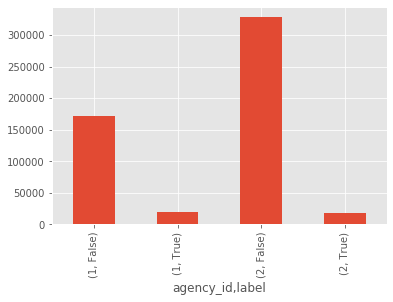

In [8]:
df.groupby([df.agency_id, df.label]).label.count().plot.bar();

agency_id  label
1          False    0.899115
           True     0.100885
2          False    0.948741
           True     0.051259
Name: label, dtype: float64

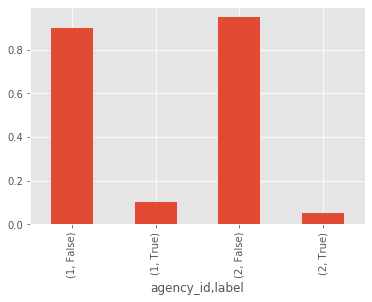

In [9]:
dft = df.groupby([df.agency_id, df.label]).label.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

- Agency 1: in average there is accepted one offer every 10
- Agency 2: in average there is accepted one offer every 20

In [10]:
cols = ['driver_position_lat', 'driver_position_lng']
df[df.label][cols].dropna().info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29315 entries, 0 to 537449
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   driver_position_lat  29315 non-null  float64
 1   driver_position_lng  29315 non-null  float64
dtypes: float64(2)
memory usage: 687.1 KB


In [11]:
df.offer_time.min(), df.offer_time.max()

(Timestamp('2019-09-30 07:29:50'), Timestamp('2020-04-03 16:48:06'))

In [12]:
fig = go.Figure()

fig.add_trace(go.Scattermapbox(
    mode = "markers",
    lat = df[df.label].driver_position_lat.values[:],
    lon = df[df.label].driver_position_lng.values[:],
    marker = {'size': 5, 'color': 'rgba(255, 100, 100, 0.5)'}))

# test this for auto centering:
fig.update_geos(fitbounds="locations")

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        #'accesstoken': 'TOKEN',
        'center': {'lat': df[df.label].driver_position_lat.mean(),
                   'lon': df[df.label].driver_position_lng.mean()},
        'style': 'carto-positron', #'open-street-map',
        'zoom': 10})

fig.show()

In [13]:
df.groupby([df.agency_id, df.label]).distance_to_agency.describe()

count       mean         std  min       25%       50%  \
agency_id label                                                             
1         False  171201.0   1.125299    2.274467 -1.0 -1.000000  0.024062   
          True    19255.0   0.896191    2.001390 -1.0  0.007263  0.022311   
2         False  327875.0  15.372051  387.795795 -1.0 -1.000000  1.153406   
          True    17701.0  22.039601  490.650099 -1.0  0.014099  0.622794   

                      75%           max  
agency_id label                          
1         False  3.292561      6.172470  
          True   2.046628      6.005059  
2         False  2.833485  13184.008965  
          True   2.119460  13181.918515

- mean distance for agency 2 doesn't look good. Looking at max value we see that maybe we have some weird outliers. We will need to resolve this before using trusting in descriptive statistics.

In [14]:
condition = (df.agency_id == '2') & (df.distance_to_agency > 50)
df[condition].distance_to_agency.count()

590

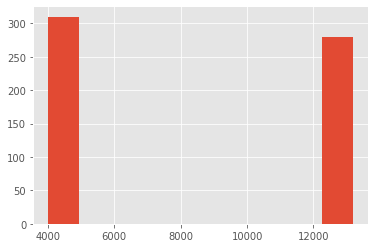

In [15]:
df[condition].distance_to_agency.hist()

In [16]:
df[condition].driver_id.nunique()

109

In [17]:
df[condition].groupby(df.label).label.count()

label
False    550
True      40
Name: label, dtype: int64

In [18]:
# What to do with these 590 rejections that were located to more than 4.000 and 12.000 Km ???
# 1) Set it to null
# 2) Set it to 0
# 3) Set it to an agency driver's average distance
# 4) Set it to tipical same driver average distance (without outliers)
# 5) Set to similar drivers distance (no time for this)
# 6) Drop rows (don't like this path)

In [19]:
cond = (df.agency_id == '2') & (df.distance_to_agency < 50)
agency_avg_distance = df[cond].distance_to_agency.mean()
# Try to go with option 4
for idx in df[condition].index:
    r = df[df.index == idx]
    md = df[cond & (df.driver_id == r.driver_id.item())].distance_to_agency
    if len(md) > 0:
        # option 4
        md = md.mean()
        if md < 0: md = -1
    else:
        # if not then option 3
        md = agency_avg_distance

    df.loc[df.index==idx, 'distance_to_agency'] = md

In [20]:
df.groupby([df.agency_id, df.label]).distance_to_agency.describe()

count      mean       std  min       25%       50%  \
agency_id label                                                          
1         False  171201.0  1.125299  2.274467 -1.0 -1.000000  0.024062   
          True    19255.0  0.896191  2.001390 -1.0  0.007263  0.022311   
2         False  327875.0  1.450333  2.028241 -1.0 -1.000000  1.149709   
          True    17701.0  1.056915  1.746272 -1.0  0.014086  0.620145   

                      75%        max  
agency_id label                       
1         False  3.292561   6.172470  
          True   2.046628   6.005059  
2         False  2.832771  16.657608  
          True   2.107065  12.339176

- Minimum distance -1 means that was not possible to obtain drivers location looking at the availability data set. Are Loggi sending messages to drivers outside the area we have received? Or is Loggi sending request to drivers that are not working at requesting time?
- Avg distance for accepted itineraries tends to be shorter than distance for rejected itineraries.
- Looking at the median we can see that agency 1's drivers tend to be at the agency when accepting but at the same time drivers are at the agency when rejecting. It is possible that these drivers becouse of being at the agency receive too many requests per driver and he/she has not time to decide and ignore them.
- Agency 2's drivers tend to be closer to the agency when accepting in comparison when rejecting, but at the same time they not wait for work at the agency.
- We took calculate the distance to the driver using data in availability data set. So, it is truncated data. The agency area radius is no more than 6 or 7 km. So, if we have distances that exceed 6 or 7 km, we could suspect of drivers that are going from one agency zone to the other. Using this knowledge and looking at agencies drivers max distances, we can think that there are drivers at agency 2 that have worked at agency 1 zone, but not many drivers at agency 1 that have worked at agency 2.

In [21]:
df['worked'] = df['previous_work'].apply(lambda x: 1 if x > 0 else 0)
df['worked_last_10_days'] = df['previous_work_10_days'].apply(lambda x: 1 if x > 0 else 0)

### At what distance was the driver when he/she received the job request?

Agency 1 max accepted distance: 6.005058739731058
Agency 2 max accepted distance: 12.339175685076627


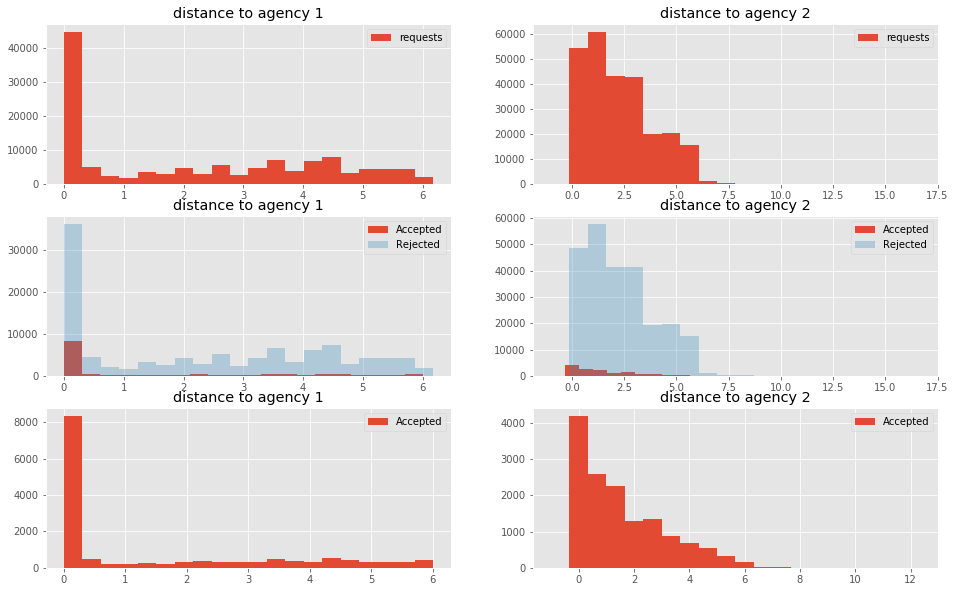

In [22]:
fig, axes = plt.subplots(3, 2, figsize=(16,10))
axes = axes.flatten()
for i, (a, g) in enumerate(df.groupby([df.agency_id])):
    g = g.dropna()
    axes[i].hist(g.distance_to_agency, bins=20, label='requests')
    axes[i].legend()
    axes[i].set_title('distance to agency {}'.format(a))
    
    axes[i+2].hist(g[g.label==True].distance_to_agency, bins=20, label='Accepted')
    axes[i+2].hist(g[g.label==False].distance_to_agency, bins=20, label='Rejected', alpha=0.3)
    axes[i+2].legend()
    axes[i+2].set_title('distance to agency {}'.format(a))

    axes[i+4].hist(g[g.label==True].distance_to_agency, bins=20, label='Accepted')   
    axes[i+4].legend()
    axes[i+4].set_title('distance to agency {}'.format(a))
    
    print('Agency {} max accepted distance: {}'.format(a, g[g.label==True].distance_to_agency.max()))


- The closer to the agency, the more likely to be notified by Loggi.
- The closer to the agency, the more likely to accept an itinerary.
- Agency 1 looks like if all drivers were going directly to the agency looking for work before checking the app.

In [23]:
def plot_density_map(lat, lng, radious=5):

    fig = go.Figure()

    fig.add_trace(go.Densitymapbox(lat=lat, lon=lng, radius=radious))
    
    # test this for auto centering:
    fig.update_geos(fitbounds="locations")

    fig.update_layout(
        margin ={'l':0,'t':0,'b':0,'r':0},
        mapbox = {
            #'accesstoken': 'TOKEN',
            'center': {'lat': lat.mean(),
                       'lon': lng.mean()},
            'style': 'carto-positron', #'open-street-map',
            'zoom': 10})

    fig.show()

### Where was each driver when he/she was requested?

In [24]:
dft = df.dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

### Where was each driver when he/she accepted the job?

In [25]:
dft = df[df.label][['driver_position_lat','driver_position_lng']].dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

### Where was each driver when he/she rejected the job?

In [26]:
dft = df[df.label == False][['driver_position_lat','driver_position_lng']].dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

The rejection locations tend to be more spread. The iluminated area is bigger in the whole agencies areas.

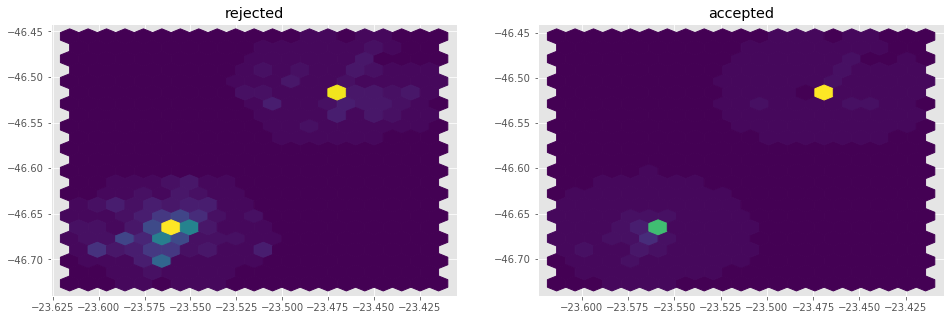

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(16,5))
axes = axes.flatten()
for i, (a, g) in enumerate(df.groupby(['label'])):
    t = g[['driver_position_lat','driver_position_lng']].dropna().sample(10000)
    x = t.driver_position_lat
    y = t.driver_position_lng
    axes[i].hexbin(x.values, y.values, gridsize=20, bins=50)
    title = 'rejected' if a == 0 else 'accepted'
    axes[i].set_title(title)

In [28]:
df.describe()

,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,worked,worked_last_10_days
count,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000,537468.000000,537468.000000
mean,5.236288,1.313625,-23.531915,-46.617762,10.787314,2.120826,0.790477,0.461069
std,4.902092,2.108144,0.048317,0.075025,21.166972,3.839745,0.406969,0.498483
min,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000,0.000000,0.000000
25%,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000,1.000000,0.000000
50%,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000,1.000000,0.000000
75%,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000,1.000000,1.000000
max,131.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000,1.000000,1.000000


In [29]:
df[df.intensity_pushes > 13].intensity_pushes.sort_values(ascending=False)

452410    131
53275      83
219320     70
280549     70
386645     70
         ... 
412518     14
412166     14
412165     14
412159     14
356991     14
Name: intensity_pushes, Length: 8856, dtype: int64

- We have counted pushes in last driver hour to calculate intesity pushes. We suppose that there was only at leas as 13 pushes in an hour because messages go in period of 5 minutes.
- User using two devices and then double counting?

In [30]:
df[df.intensity_pushes > 26].intensity_pushes.sort_values(ascending=False)

452410    131
53275      83
386645     70
219320     70
280549     70
         ... 
359755     27
316376     27
293897     27
222632     27
533850     27
Name: intensity_pushes, Length: 82, dtype: int64

In [31]:
df[df.intensity_pushes > 26].driver_id.nunique()

19

In [32]:
df[df.intensity_pushes == 131]

,agency_id,driver_id,itinerary_id,offer_time,availability,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,label,worked,worked_last_10_days
452410,2,0ab733490f81e4326ddd7512663c9036,6051d567b04000c63b1bb0030ef98da9,2019-12-13 07:04:12,True,131,2.538427,-23.560301,-46.694294,7,4,False,1,1


In [33]:
careful_query("""
    select count(1) from availability
    where driver_id = '0ab733490f81e4326ddd7512663c9036'
""")

,count
0,7419


Maybe there push can be generated by the user and this day this drivers made 131 pushes in an hour

In [34]:
# Let's set 13 as max intensity

In [35]:
df.loc[df.intensity_pushes > 13, 'intensity_pushes'] = 13

In [36]:
df.describe()

,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,worked,worked_last_10_days
count,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000,537468.000000,537468.000000
mean,5.168752,1.313625,-23.531915,-46.617762,10.787314,2.120826,0.790477,0.461069
std,4.739179,2.108144,0.048317,0.075025,21.166972,3.839745,0.406969,0.498483
min,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000,0.000000,0.000000
25%,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000,1.000000,0.000000
50%,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000,1.000000,0.000000
75%,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000,1.000000,1.000000
max,13.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000,1.000000,1.000000


In [37]:
df.availability = df.availability.astype('int')
df.label = df.label.astype('int')

In [38]:
df.describe()

,availability,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,label,worked,worked_last_10_days
count,537468.000000,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000,537468.000000,537468.000000,537468.000000
mean,0.702918,5.168752,1.313625,-23.531915,-46.617762,10.787314,2.120826,0.068955,0.790477,0.461069
std,0.456973,4.739179,2.108144,0.048317,0.075025,21.166972,3.839745,0.253377,0.406969,0.498483
min,0.000000,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000,0.000000,1.000000,0.000000
50%,1.000000,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000,0.000000,1.000000,0.000000
75%,1.000000,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000,0.000000,1.000000,1.000000
max,1.000000,13.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000,1.000000,1.000000,1.000000


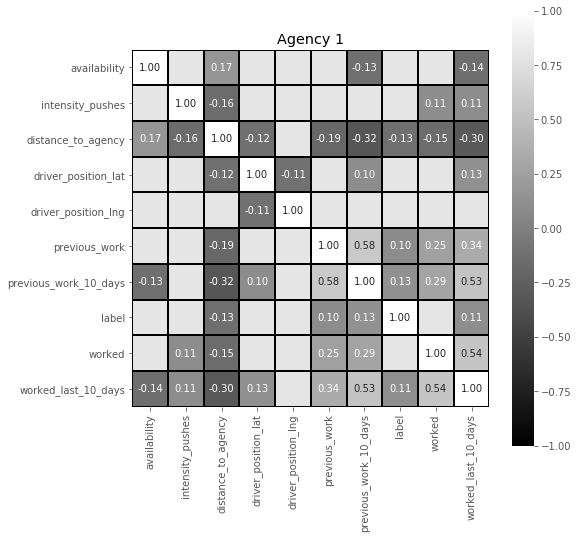

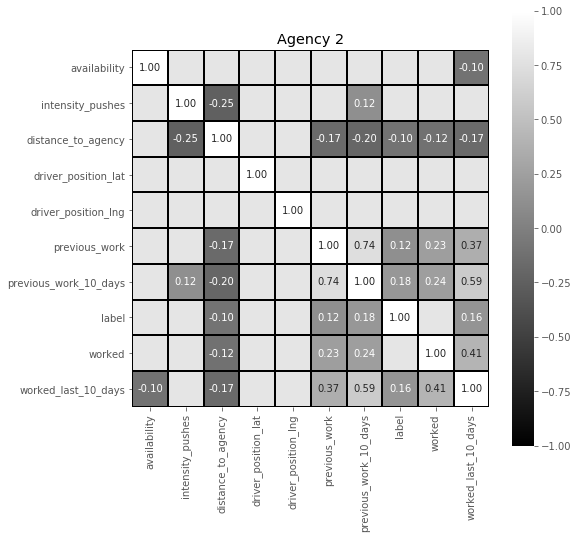

In [39]:
for a, g in df.dropna().groupby('agency_id'):
    plt.figure(figsize=(8,8))
    sns.heatmap(g.corr()[g.corr().abs() > 0.1], vmin=-1, vmax=1, annot = True, square = True,
       center= 0, cmap= 'gray', linewidths=1, linecolor='black', fmt='.2f').set_title('Agency {}'.format(a))

T-Test over driver to agency distance on rejected vs accepted
                          Test for equality of means                          
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
subset #1      0.8356      0.018     47.067      0.000       0.801       0.870
agency 1 t-statistic: 47.067 p-value: 0.000
                          Test for equality of means                          
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
subset #1      0.7380      0.014     51.533      0.000       0.710       0.766
agency 2 t-statistic: 51.533 p-value: 0.000


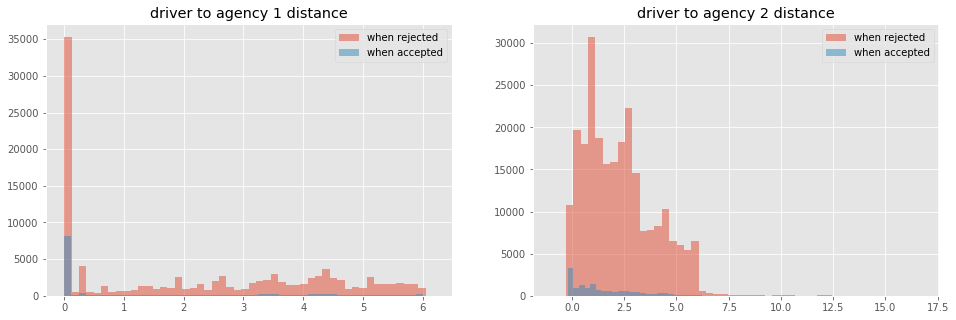

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(16,5))
print('T-Test over driver to agency distance on rejected vs accepted')
for i, (a, g) in enumerate(df.dropna().groupby('agency_id')):
    
    d1 = statsmodels.stats.weightstats.DescrStatsW(g[g.label==0].distance_to_agency)
    d2 = statsmodels.stats.weightstats.DescrStatsW(g[g.label==1].distance_to_agency)
    
    r = statsmodels.stats.weightstats.CompareMeans(d1, d2)
    print(r.summary())

    tt, p_value, fr = statsmodels.stats.weightstats.ttest_ind(
                            g[g.label==0].distance_to_agency,
                            g[g.label==1].distance_to_agency)
    print('agency {} t-statistic: {:.03f} p-value: {:.03f}'.format(a, tt, p_value))
    g[g.label == 0].distance_to_agency.hist(bins=50, alpha=0.5, ax=axes[i], label='when rejected')
    g[g.label == 1].distance_to_agency.hist(bins=50, alpha=0.5, ax=axes[i], label='when accepted')
    axes[i].legend()
    axes[i].set_title('driver to agency {} distance'.format(a))

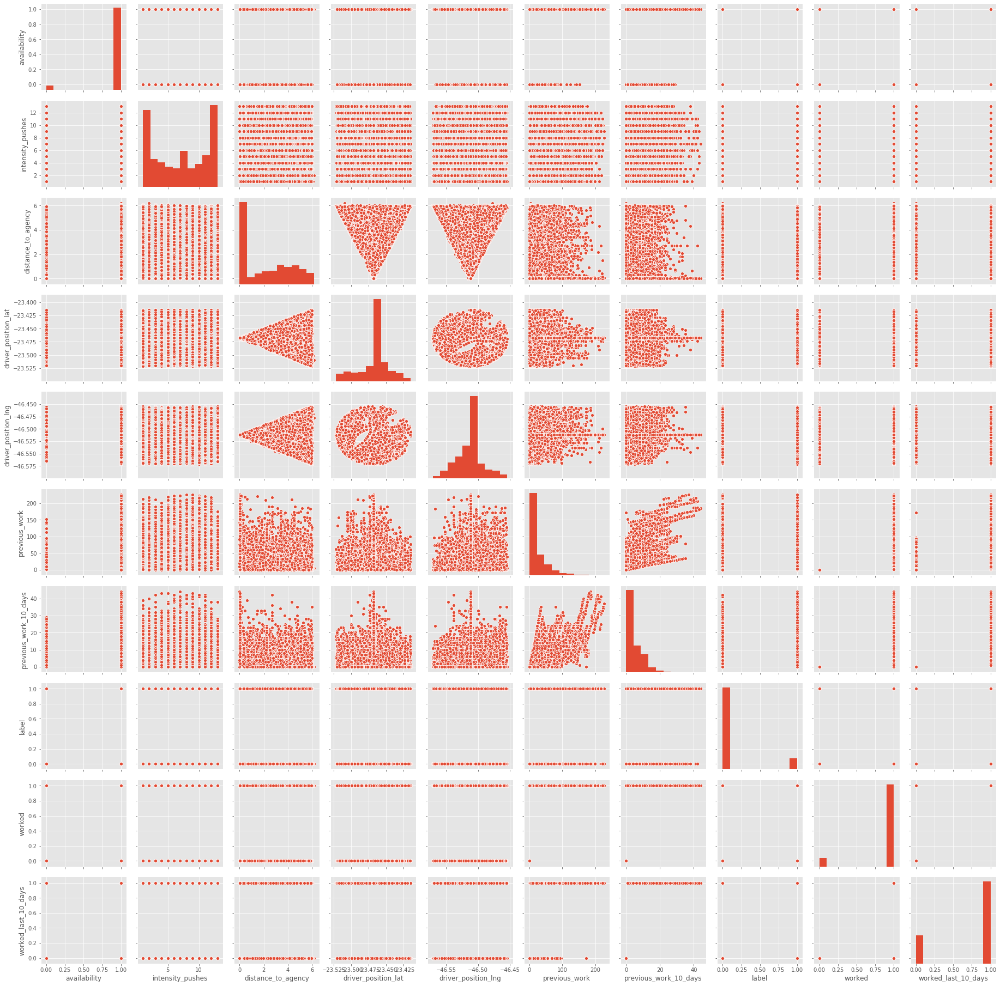

In [41]:
dft = df.dropna()
sns.pairplot(dft[dft.agency_id == '1'].select_dtypes('number'));

TODO: comment the above scatterplots!

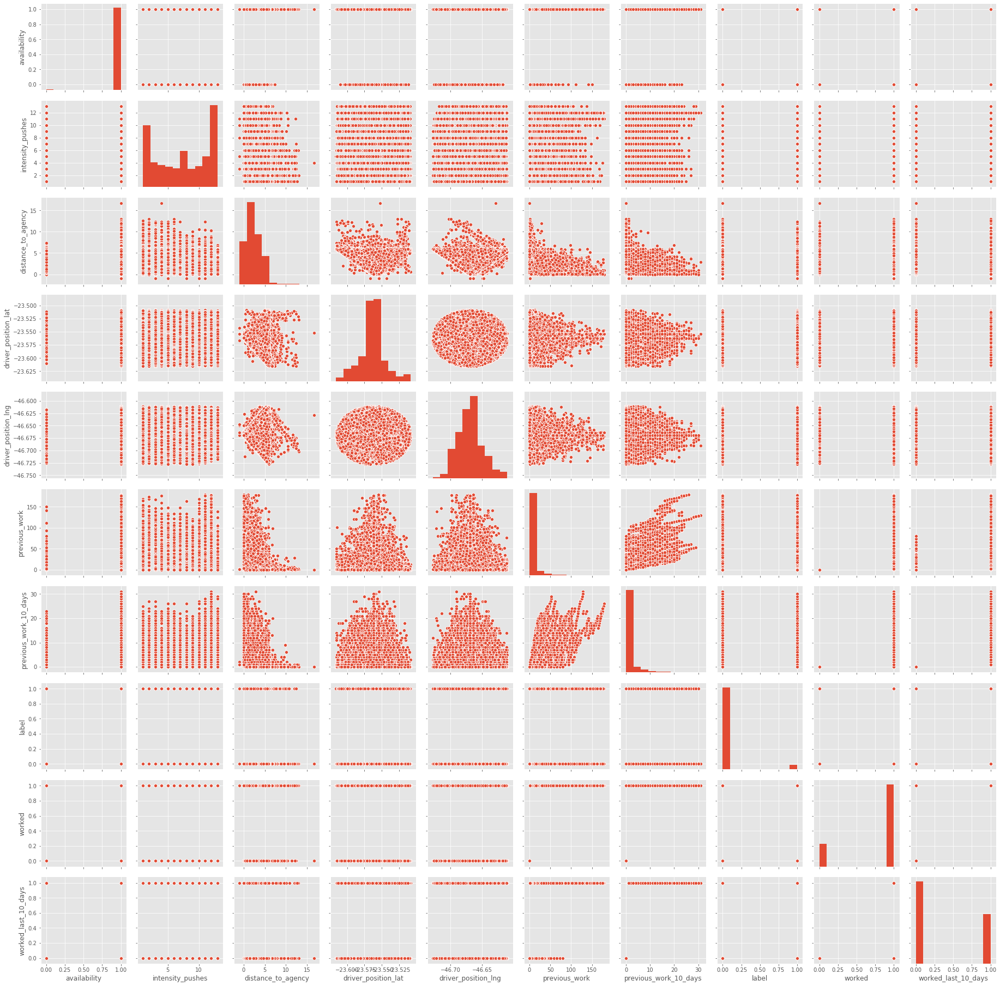

In [42]:
dft = df.dropna()
sns.pairplot(dft[dft.agency_id == '2'].select_dtypes('number'));

TODO: comment the above scatterplots!

In [43]:
columns = [col for col in df.columns if 'position' not in col]
df[df.agency_id == '1'][columns].isna().sum()

agency_id                   0
driver_id                   0
itinerary_id                0
offer_time                  0
availability                0
intensity_pushes            0
distance_to_agency       1197
previous_work               0
previous_work_10_days       0
label                       0
worked                      0
worked_last_10_days         0
dtype: int64

In [44]:
avg_dist = df[(df.agency_id == '1') & (df.distance_to_agency.notnull())].distance_to_agency.mean()
df.loc[(df.agency_id == '1') & (df.distance_to_agency.isnull()), 'distance_to_agency'] = avg_dist

avg_dist = df[(df.agency_id == '2') & (df.distance_to_agency.notnull())].distance_to_agency.mean()
df.loc[(df.agency_id == '2') & (df.distance_to_agency.isnull()), 'distance_to_agency'] = avg_dist

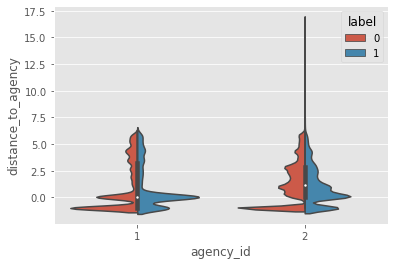

In [45]:
sns.violinplot(x='agency_id', y='distance_to_agency', hue='label', data=df, split=True);

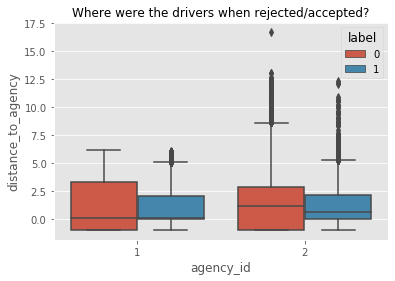

In [46]:
sns.boxplot(x='agency_id', y='distance_to_agency', hue='label', data=df) \
    .set_title('Where were the drivers when rejected/accepted?', fontsize=12);

- Distance is a clear feature that is related with acceptation

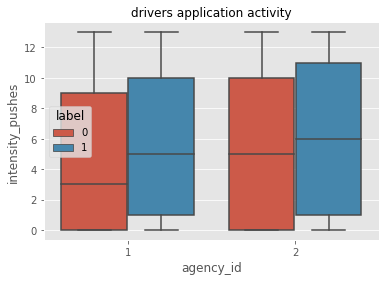

In [47]:
sns.boxplot(x='agency_id', y='intensity_pushes', hue='label', data=df) \
        .set_title('drivers application activity', fontsize=12);

- Intensity Pushes is related too.

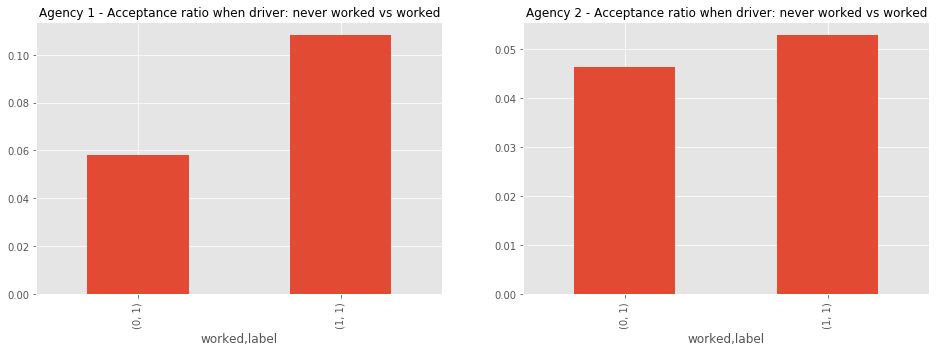

In [48]:
fig, axes = plt.subplots(1,2, figsize=(16,5))
for i, (a, g) in enumerate(df.groupby('agency_id')):
    t = g.groupby(['worked', 'label'])['worked'].count() / g.groupby(['worked'])['worked'].count()
    t[t.index[1:4:2]].plot.bar(ax=axes[i]).set_title('Agency {} - Acceptance ratio when driver: never worked vs worked' \
                        .format(a), fontsize=12)
    
#plt.show()

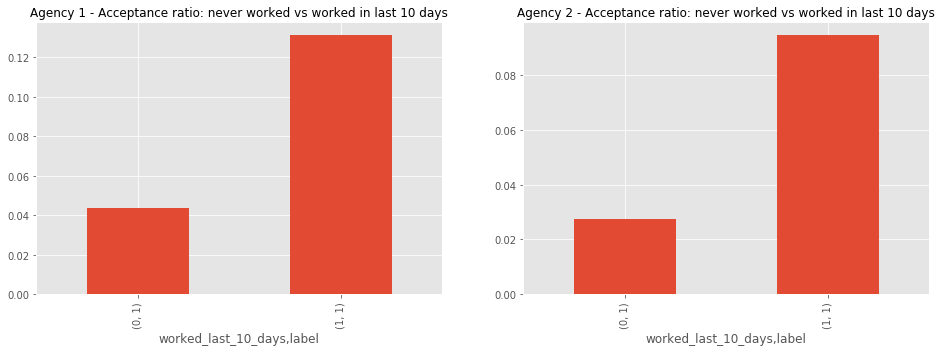

In [49]:
fig, axes = plt.subplots(1,2, figsize=(16,5))
for i, (a, g) in enumerate(df.groupby('agency_id')):
    t = g.groupby(['worked_last_10_days', 'label'])['worked_last_10_days'].count() / g.groupby(['worked_last_10_days'])['worked_last_10_days'].count()
    t[t.index[1:4:2]].plot.bar(ax=axes[i]).set_title('Agency {} - Acceptance ratio: never worked vs worked in last 10 days' \
                        .format(a), fontsize=12)
    
#plt.show()

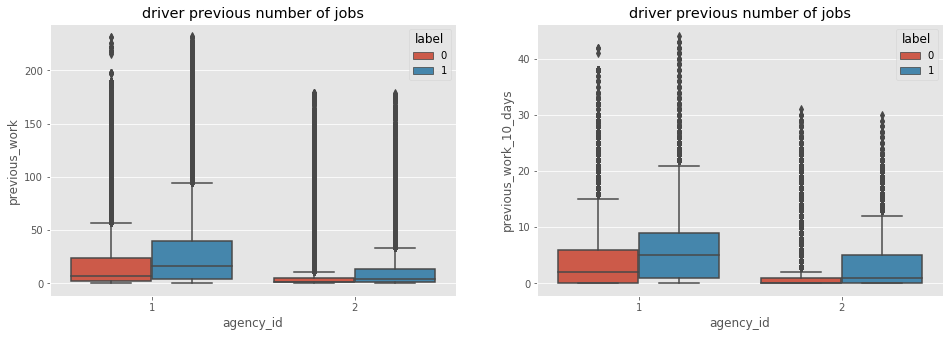

In [50]:
fig, axes = plt.subplots(1,2,figsize=(16,5))
for i, col in enumerate(['previous_work', 'previous_work_10_days']):
    sns.boxplot(x='agency_id', y=col, hue='label', data=df, ax=axes[i]);
    axes[i].set_title('driver previous number of jobs');

-  This feature present many outliers

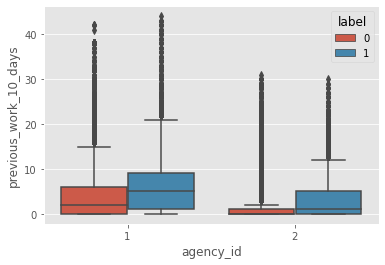

In [51]:
sns.boxplot(x='agency_id', y='previous_work_10_days', hue='label', data=df);

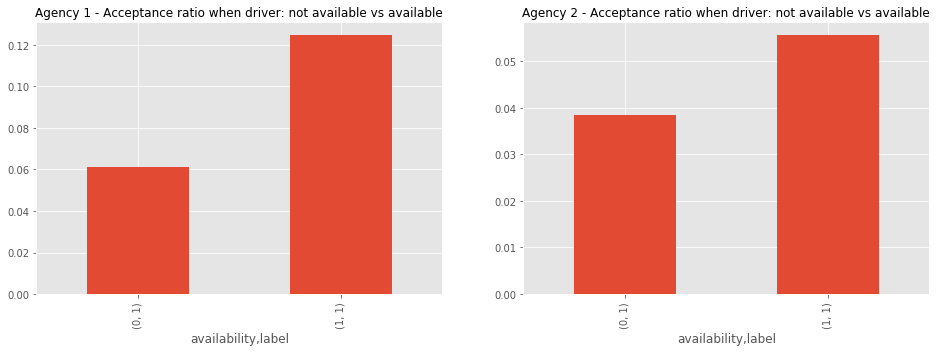

In [52]:
fig, axes = plt.subplots(1,2, figsize=(16,5))
for i, (a, g) in enumerate(df.groupby('agency_id')):
    t = g.groupby(['availability', 'label'])['availability'].count() / g.groupby(['availability'])['availability'].count()
    t[t.index[1:4:2]].plot.bar(ax=axes[i]).set_title('Agency {} - Acceptance ratio when driver: not available vs available' \
                        .format(a), fontsize=12)
    
#plt.show()

- This feature too presents many outliers but again there is some relation. Blue dominate red. The more you work in previous ten days, the more likely you will accept a job.

In [53]:
dft = df[df.agency_id == '1'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.304662
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               191653
Model:                          Logit   Df Residuals:                   191645
Method:                           MLE   Df Model:                            7
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.06838
Time:                        09:57:21   Log-Likelihood:                -58389.
converged:                       True   LL-Null:                       -62675.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2568      0.026     47.456      0.000       1.205       1.309
intensity_pushes         -0.0255      0.002    -12.016      0.000      -0.030      -0.021
distance_to_agency       -0.1890      0.005    -38.529      0.000      -0.199      -0.179
previous_work             0.0003      0.000      1.076      0.282      -0.000       0.001
previous_work_10_days     0.0426      0.002     23.182      0.000       0.039       0.046
worked                   -0.6108      0.039    -15.785      0.000      -0.687      -0.535
worked_last_10_days       0.9957      0.032     31.244      0.000       0.933       1.058
Intercept                -3.1545      0.028   -114.638      0.000      -3.208      -3.101
=========================================================================================
"""

In [54]:
for coef in [1.3383, -0.0213, -0.2033, 0.0003, 0.0644, -3.1032]:
    print(np.exp(coef)-1)

2.812556646799247
-0.021074757059464044
-0.18396660531796982
0.00030004500450031557
0.06651892101977452
-0.9550947246480174


In [55]:
np.exp(-3.1032) / (1 - np.exp(-3.1032))

0.047016567250470015

- if availability is true, then odds increases by more than 2.8 times
- if intensity pushes increase by one then odds decrease by more than 2% (weird)
- if distance increase by 1 km, then odds decrease by 18%
- if previous work increase by 1, then odds does not change. Not significant variable.
- if previous work in last 10 days increase by 1, then odds increase by 6.65%
- The base level probability of accepting a job is 4.7%

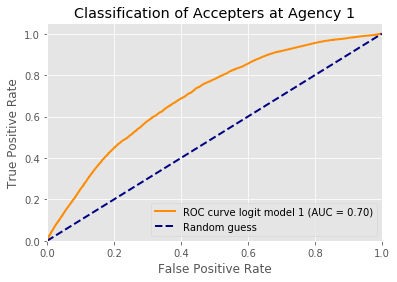

In [56]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [57]:
dft = df[df.agency_id == '2'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.184000
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               345815
Model:                          Logit   Df Residuals:                   345807
Method:                           MLE   Df Model:                            7
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.09003
Time:                        09:57:24   Log-Likelihood:                -63630.
converged:                       True   LL-Null:                       -69925.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.1740      0.032     36.666      0.000       1.111       1.237
intensity_pushes         -0.0335      0.002    -15.255      0.000      -0.038      -0.029
distance_to_agency       -0.2376      0.006    -37.421      0.000      -0.250      -0.225
previous_work            -0.0043      0.001     -7.360      0.000      -0.005      -0.003
previous_work_10_days     0.1006      0.003     32.670      0.000       0.095       0.107
worked                   -1.1178      0.027    -41.218      0.000      -1.171      -1.065
worked_last_10_days       1.4252      0.026     55.616      0.000       1.375       1.475
Intercept                -3.3753      0.022   -152.719      0.000      -3.419      -3.332
=========================================================================================
"""

In [58]:
for coef in [1.2035, -0.0355, -0.2544, -0.0094, 0.1696, -3.5799]:
    print(np.exp(coef)-1)

2.331757691428053
-0.0348772657699995
-0.22461841262727167
-0.009355958105965234
0.18483082419158348
-0.9721215140355444


In [59]:
np.exp(-3.5799) / (1 - np.exp(-3.5799))

0.028677984760078403

- if availability is true, then odds increases by more than 2 times
- if intensity pushes increase by one then odds decrease by less than 3.5% (weird)
- if distance increase by 1 km, then odds decrease by 22%
- if previous work increase by 1, then odds decrease by 0.9% (weird)
- if previous work in last 10 days increase by 1, then odds increase by 18.5%
- The probability base level to accept an itinerary is almost 3%

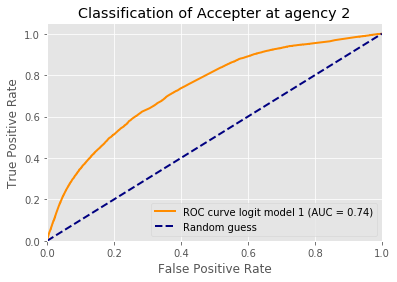

In [60]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])

plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepter at agency 2')
plt.legend(loc='lower right')
plt.show()

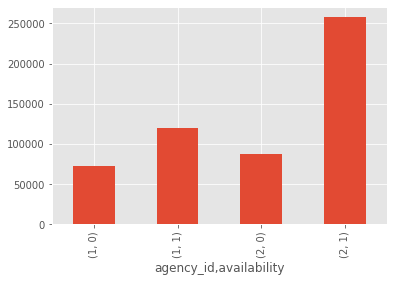

In [61]:
df.groupby(['agency_id', 'availability']).availability.count().plot.bar();

agency_id  availability
1          0               0.375361
           1               0.624639
2          0               0.253699
           1               0.746301
Name: availability, dtype: float64

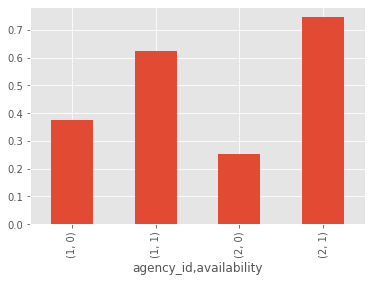

In [62]:
dft = df.groupby([df.agency_id, df.availability]).availability.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

agency_id  availability  label
1          0             0        0.352366
                         1        0.022995
           1             0        0.546749
                         1        0.077891
2          0             0        0.243931
                         1        0.009768
           1             0        0.704810
                         1        0.041490
Name: availability, dtype: float64

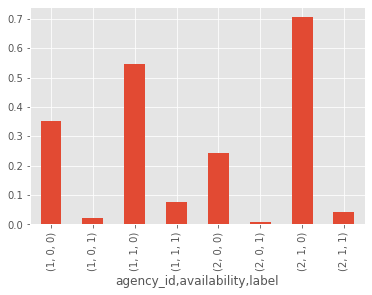

In [63]:
dft = df.groupby([df.agency_id, df.availability, df.label]).availability.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

In [64]:
df.offer_time = pd.to_datetime(df.offer_time)
df.set_index(df.offer_time, drop=True, inplace=True)

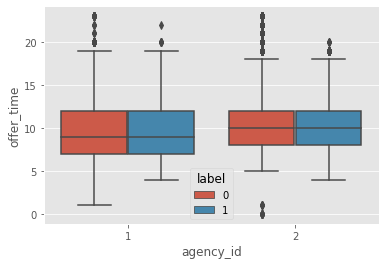

In [65]:
sns.boxplot(x='agency_id', y=df.offer_time.dt.hour, data=df, hue='label');

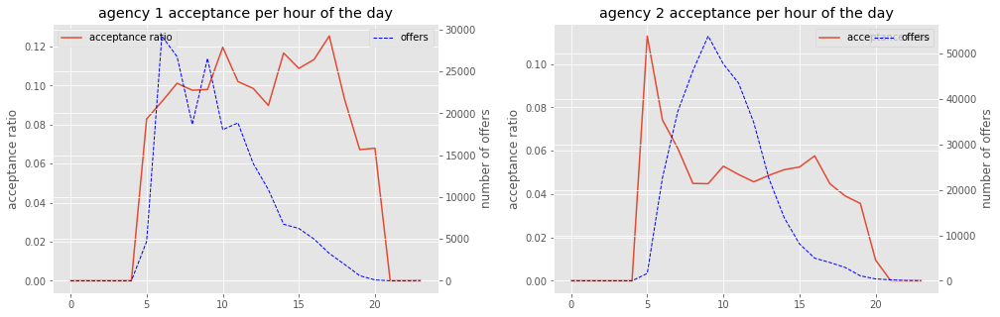

In [66]:
fig, axes = plt.subplots(1, 2, figsize=(16,5))
for i, (a, g) in enumerate(df.groupby('agency_id')):
    ratios = []
    offers = []
    for h in range(24):
        accepted = g[(g.offer_time.dt.hour == h) & (g.label == 1)].label.count()
        t = g[g.offer_time.dt.hour == h].label.count()
        offers.append(t)
        ratios.append(accepted/t if t > 5 else 0)
    axes[i].plot(list(range(24)), ratios, label='acceptance ratio')
    axes[i].set_title('agency {} acceptance per hour of the day'.format(a))
    axes[i].set_ylabel('acceptance ratio')
    axes[i].legend()
    ax = axes[i].twinx()
    ax.plot(offers, color='b', ls='--', lw=1, label='offers')
    ax.legend()
    ax.set_ylabel('number of offers')
plt.subplots_adjust(wspace=0.3)

In [67]:
columns = [col for col in df.select_dtypes('number').columns if col not in ['driver_position_lat', 'driver_position_lng', 'previous_work']]
columns

['availability',
 'intensity_pushes',
 'distance_to_agency',
 'previous_work_10_days',
 'label',
 'worked',
 'worked_last_10_days']

In [68]:
df_Xy = df[df.agency_id=='1'][columns].copy()

In [69]:
df_Xy['hour'] = df_Xy.index.hour
df_Xy['weekend'] = df_Xy.index.dayofweek
df_Xy['weekend'] = df_Xy['weekend'].apply(lambda x: 0 if x < 5 else 1)

In [70]:
df_Xy.head()

,availability,intensity_pushes,distance_to_agency,previous_work_10_days,label,worked,worked_last_10_days,hour,weekend
offer_time,,,,,,,,,
2019-10-26 09:21:11,1,6,0.021653,10,1,1,1,9,1
2020-03-04 17:00:08,1,10,0.020956,14,1,1,1,17,0
2020-02-26 15:50:16,1,12,0.021263,15,1,1,1,15,0
2019-12-21 12:09:16,1,12,0.021599,21,1,1,1,12,1
2019-11-08 06:32:24,0,0,-1.000000,0,1,0,0,6,0


In [71]:
df_Xy.isna().sum()

availability             0
intensity_pushes         0
distance_to_agency       0
previous_work_10_days    0
label                    0
worked                   0
worked_last_10_days      0
hour                     0
weekend                  0
dtype: int64

In [72]:
df_Xy['Intercept'] = 1

X = df_Xy[[col for col in df_Xy.select_dtypes('number') if col != 'label']]
y = df_Xy['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.304300
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               191653
Model:                          Logit   Df Residuals:                   191644
Method:                           MLE   Df Model:                            8
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.06949
Time:                        09:57:30   Log-Likelihood:                -58320.
converged:                       True   LL-Null:                       -62675.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2481      0.026     47.158      0.000       1.196       1.300
intensity_pushes         -0.0261      0.002    -12.220      0.000      -0.030      -0.022
distance_to_agency       -0.1880      0.005    -38.172      0.000      -0.198      -0.178
previous_work_10_days     0.0436      0.002     27.836      0.000       0.041       0.047
worked                   -0.5936      0.039    -15.338      0.000      -0.669      -0.518
worked_last_10_days       0.9910      0.032     31.093      0.000       0.929       1.054
hour                      0.0111      0.003      4.367      0.000       0.006       0.016
weekend                  -0.2957      0.027    -11.045      0.000      -0.348      -0.243
Intercept                -3.2318      0.038    -85.176      0.000      -3.306      -3.157
=========================================================================================
"""

In [73]:
np.exp(0.0097) - 1, np.exp(-0.3077) - 1 

(0.009747197481755343, -0.2648641743210318)

- Weekend decreases odds in 26%
- Every hour increase 1%

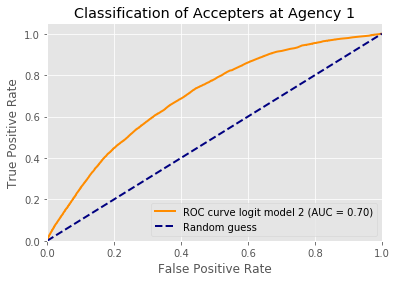

In [74]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 2 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [75]:
df_Xy = df[df.agency_id=='2'][columns].copy()

In [76]:
df_Xy['hour'] = df_Xy.index.hour
df_Xy['weekend'] = df_Xy.index.dayofweek
df_Xy['weekend'] = df_Xy['weekend'].apply(lambda x: 0 if x < 5 else 1)

In [77]:
df_Xy.isna().sum()

availability             0
intensity_pushes         0
distance_to_agency       0
previous_work_10_days    0
label                    0
worked                   0
worked_last_10_days      0
hour                     0
weekend                  0
dtype: int64

In [78]:
df_Xy['Intercept'] = 1

X = df_Xy[[col for col in df_Xy.select_dtypes('number') if col != 'label']]
y = df_Xy['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.183268
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               345815
Model:                          Logit   Df Residuals:                   345806
Method:                           MLE   Df Model:                            8
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.09365
Time:                        09:57:32   Log-Likelihood:                -63377.
converged:                       True   LL-Null:                       -69925.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2201      0.032     38.018      0.000       1.157       1.283
intensity_pushes         -0.0202      0.002     -8.749      0.000      -0.025      -0.016
distance_to_agency       -0.2529      0.006    -39.674      0.000      -0.265      -0.240
previous_work_10_days     0.0798      0.002     37.670      0.000       0.076       0.084
worked                   -1.1428      0.027    -42.136      0.000      -1.196      -1.090
worked_last_10_days       1.4371      0.026     56.357      0.000       1.387       1.487
hour                     -0.0607      0.003    -18.006      0.000      -0.067      -0.054
weekend                   0.4782      0.029     16.722      0.000       0.422       0.534
Intercept                -2.8788      0.037    -78.533      0.000      -2.951      -2.807
=========================================================================================
"""

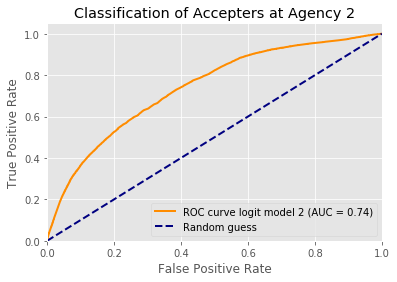

In [79]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 2 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 2')
plt.legend(loc='lower right')
plt.show()

In [80]:
# The file was generated by the weather script.
filename = '../data/weather_daily_2019-10-01_2020-03-25.json'

if not os.path.exists(filename):
    raise 'file not exists'

with open(filename) as f:
    data = json.load(f)

In [81]:
# json into dataframe
df_w = pd.DataFrame(data).T

# will drop any column not listed here
selection = """
precipIntensity, precipProbability, windSpeed,
temperatureHigh, windGust, cloudCover
"""
selection = [col.strip() for col in selection.split(',')]
for col in df_w.columns:
    if col not in selection:
        del df_w[col]
    elif col not in ['summary', 'icon']:
        # set column type to float
        df_w[col] = df_w[col].astype('float')

In [82]:
df_w.index.min()

'2019-10-01T00:00:00'

In [83]:
dfc = df.copy()
df = df[(df.offer_time > df_w.index.min()) & (df.offer_time < df_w.index.max())]

In [84]:
dfa = df[['agency_id'] + columns].copy()
df_w['date_'] = pd.to_datetime(df_w.index)
df_w['date_'] = df_w.date_.apply(lambda x: x.date())
dfa['date_'] = dfa.index.map(lambda x: x.date())

In [85]:
dfa = dfa.merge(df_w, left_on='date_', right_on='date_')
del df_w['date_']
del dfa['date_']

In [86]:
dfa.head(5)

,agency_id,availability,intensity_pushes,distance_to_agency,previous_work_10_days,label,worked,worked_last_10_days,precipIntensity,precipProbability,temperatureHigh,windSpeed,windGust,cloudCover
0,1,1,6,0.021653,10,1,1,1,0.0008,0.14,83.79,7.15,15.3,0.36
1,1,0,0,-1.000000,2,1,1,1,0.0008,0.14,83.79,7.15,15.3,0.36
2,1,0,0,-1.000000,0,0,0,0,0.0008,0.14,83.79,7.15,15.3,0.36
3,1,1,4,4.600170,12,1,1,1,0.0008,0.14,83.79,7.15,15.3,0.36
4,1,1,11,0.905607,1,0,1,1,0.0008,0.14,83.79,7.15,15.3,0.36


In [87]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532950 entries, 0 to 532949
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   agency_id              532950 non-null  object 
 1   availability           532950 non-null  int32  
 2   intensity_pushes       532950 non-null  int64  
 3   distance_to_agency     532950 non-null  float64
 4   previous_work_10_days  532950 non-null  int64  
 5   label                  532950 non-null  int32  
 6   worked                 532950 non-null  int64  
 7   worked_last_10_days    532950 non-null  int64  
 8   precipIntensity        532950 non-null  float64
 9   precipProbability      532950 non-null  float64
 10  temperatureHigh        532950 non-null  float64
 11  windSpeed              532950 non-null  float64
 12  windGust               532950 non-null  float64
 13  cloudCover             532950 non-null  float64
dtypes: float64(7), int32(2), int64(4), o

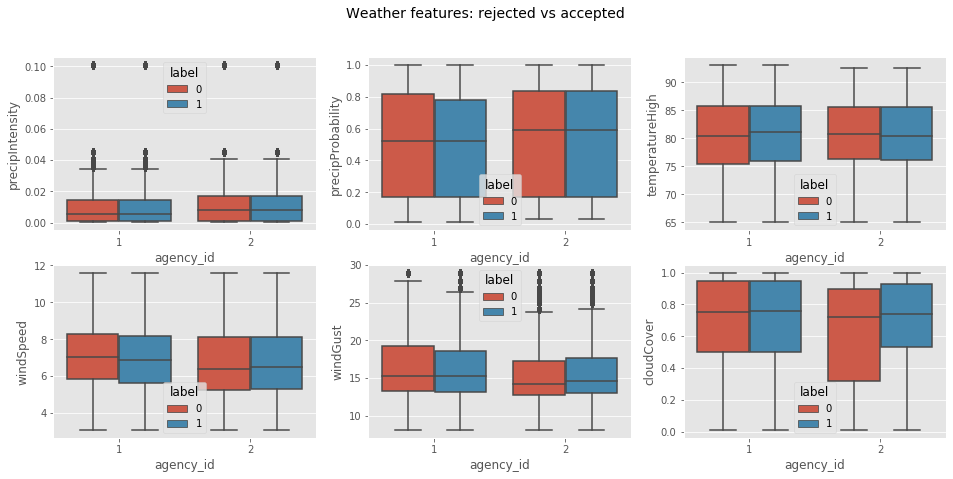

In [88]:
fig, axes = plt.subplots(2, 3, figsize=(16,7))
axes = axes.flatten()
for i, col in enumerate(df_w.columns):
    sns.boxplot(x='agency_id', y=col, hue='label', data=dfa, ax = axes[i])
    
plt.suptitle('Weather features: rejected vs accepted', fontsize=14);

In [89]:
dfa.columns

Index(['agency_id', 'availability', 'intensity_pushes', 'distance_to_agency',
       'previous_work_10_days', 'label', 'worked', 'worked_last_10_days',
       'precipIntensity', 'precipProbability', 'temperatureHigh', 'windSpeed',
       'windGust', 'cloudCover'],
      dtype='object')

In [90]:
columns = dfa.columns.tolist()
columns.remove('agency_id')

In [91]:
columns.remove('windSpeed')
columns.remove('cloudCover')
columns.remove('temperatureHigh')

In [92]:
dft = dfa[dfa.agency_id == '1'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.302626
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               190889
Model:                          Logit   Df Residuals:                   190879
Method:                           MLE   Df Model:                            9
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.06978
Time:                        09:57:39   Log-Likelihood:                -57768.
converged:                       True   LL-Null:                       -62101.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2759      0.027     47.836      0.000       1.224       1.328
intensity_pushes         -0.0249      0.002    -11.704      0.000      -0.029      -0.021
distance_to_agency       -0.1887      0.005    -38.339      0.000      -0.198      -0.179
previous_work_10_days     0.0426      0.002     26.842      0.000       0.039       0.046
worked                   -0.5608      0.039    -14.333      0.000      -0.638      -0.484
worked_last_10_days       0.9953      0.032     31.051      0.000       0.932       1.058
precipIntensity          -2.3720      0.902     -2.629      0.009      -4.140      -0.604
precipProbability         0.1562      0.036      4.286      0.000       0.085       0.228
windGust                 -0.0067      0.002     -3.489      0.000      -0.010      -0.003
Intercept                -3.1614      0.042    -75.512      0.000      -3.243      -3.079
=========================================================================================
"""

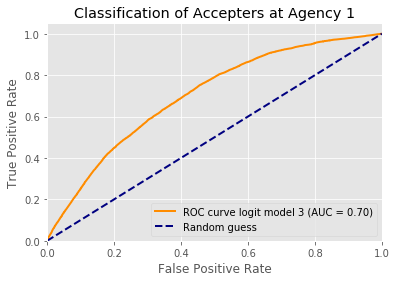

In [93]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 3 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [94]:
dft = dfa[dfa.agency_id == '2'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.183830
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               342061
Model:                          Logit   Df Residuals:                   342051
Method:                           MLE   Df Model:                            9
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.09012
Time:                        09:57:41   Log-Likelihood:                -62881.
converged:                       True   LL-Null:                       -69109.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.1477      0.032     35.713      0.000       1.085       1.211
intensity_pushes         -0.0336      0.002    -15.239      0.000      -0.038      -0.029
distance_to_agency       -0.2328      0.006    -36.571      0.000      -0.245      -0.220
previous_work_10_days     0.0846      0.002     39.891      0.000       0.080       0.089
worked                   -1.1200      0.027    -41.142      0.000      -1.173      -1.067
worked_last_10_days       1.4441      0.026     56.339      0.000       1.394       1.494
precipIntensity          -6.4545      0.879     -7.341      0.000      -8.178      -4.731
precipProbability         0.2781      0.038      7.341      0.000       0.204       0.352
windGust                  0.0145      0.002      7.523      0.000       0.011       0.018
Intercept                -3.6674      0.037    -99.919      0.000      -3.739      -3.595
=========================================================================================
"""

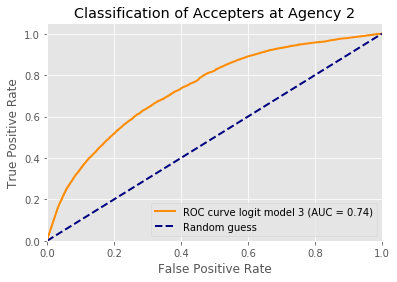

In [95]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 3 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 2')
plt.legend(loc='lower right')
plt.show()

Let's get serious

In [96]:
def compute_AUC(X, y, train_index, test_index):
    """
    feature/output: X, y
    dataset split: train_index, test_index
    """
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_test, y_test = X.iloc[test_index], y.iloc[test_index]
    
    logit = sm.Logit(y_train, X_train)
    logit_res = logit.fit()
    logit_res.summary()
    
    pred = logit_res.predict(X_test)
    fpr, tpr, _ = roc_curve(y_test, pred)
    auc_score = auc(fpr, tpr)
    
    return auc_score, fpr, tpr

In [97]:
def cross_validation_AUC(X, y, nfold=10):
    """
    use a n-fold cross-validation for computing AUC estimates
    """
    skf = StratifiedKFold(n_splits=nfold)  # create a cross-validation splitting
    auc_list = [] # this list will contain the AUC estimates associated with each fold
    for k, (train_index, test_index) in enumerate( skf.split(X, y) ):
        auc_score, _, _ = compute_AUC(X, y, train_index, test_index)
        auc_list.append(auc_score)
    return auc_list

In [98]:
dfa.keys()

Index(['agency_id', 'availability', 'intensity_pushes', 'distance_to_agency',
       'previous_work_10_days', 'label', 'worked', 'worked_last_10_days',
       'precipIntensity', 'precipProbability', 'temperatureHigh', 'windSpeed',
       'windGust', 'cloudCover'],
      dtype='object')

In [99]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532950 entries, 0 to 532949
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   agency_id              532950 non-null  object 
 1   availability           532950 non-null  int32  
 2   intensity_pushes       532950 non-null  int64  
 3   distance_to_agency     532950 non-null  float64
 4   previous_work_10_days  532950 non-null  int64  
 5   label                  532950 non-null  int32  
 6   worked                 532950 non-null  int64  
 7   worked_last_10_days    532950 non-null  int64  
 8   precipIntensity        532950 non-null  float64
 9   precipProbability      532950 non-null  float64
 10  temperatureHigh        532950 non-null  float64
 11  windSpeed              532950 non-null  float64
 12  windGust               532950 non-null  float64
 13  cloudCover             532950 non-null  float64
dtypes: float64(7), int32(2), int64(4), o

In [100]:
# this data-frame will contain the AUC estimates
model_perf = pd.DataFrame({})
for a, g in dfa.groupby('agency_id'):
    for key in g[columns].keys():
        if key == "label": continue
        X_full, y_full = g[[key]], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf["{} - SIMPLE: {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.496775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.486189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.497815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495928
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494410
  

Optimization terminated successfully.
         Current function value: 0.337423
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.334650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.336620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.336778
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.333984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.338156
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.334198
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.337001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.336266
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.332687
  

Optimization terminated successfully.
         Current function value: 0.320565
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.303110
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.292456
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.316183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.316585
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.320884
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.318425
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.320711
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.218538
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.219768
  

In [101]:
def plot_boxplot_ordered(df_model):
    """
    display a list of boxplot, ordered by the media values
    """
    df = df_model[df_model.median().sort_values().index]
    sns.boxplot(x="variable", y="value", data=pd.melt(df), showfliers=False)
    plt.xticks(rotation=90)

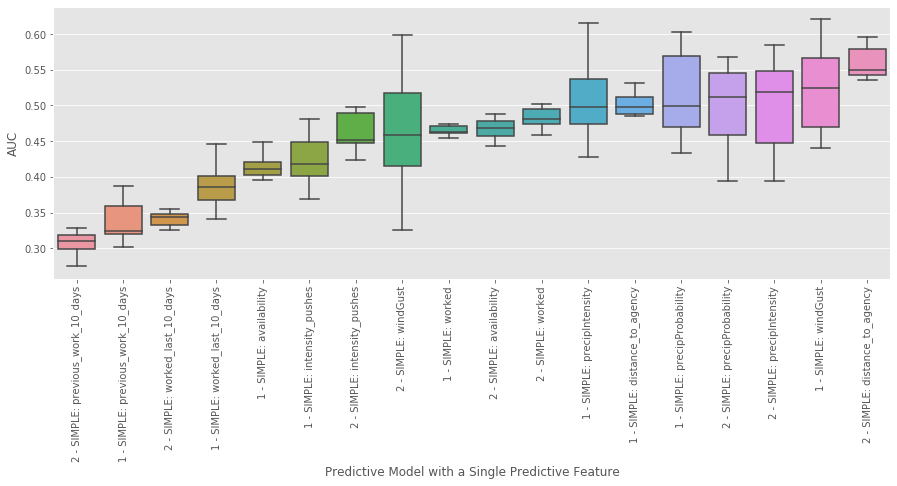

In [102]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf)
plt.xlabel("Predictive Model with a Single Predictive Feature")
plt.ylabel("AUC");

## Let's find a company for distance to agency feature

In [103]:
# this data-frame will contain the AUC estimates
pre = ['distance_to_agency', 'worked_last_10_days']
model_perf2 = pd.DataFrame({})
for (a, g) in dfa.groupby('agency_id'):
    for i, key in enumerate(g[columns].keys()):
        if key in (['label'] + pre): continue
        X_full, y_full = g[[key]+pre], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf2["{} - {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.455173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.450543
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.459933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.459163
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.455157
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.456022
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.452698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.452101
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.453710
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.449483
  

Optimization terminated successfully.
         Current function value: 0.374171
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.370103
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.371010
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.371932
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.371280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.370483
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.376062
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.378148
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.375410
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.435336
  

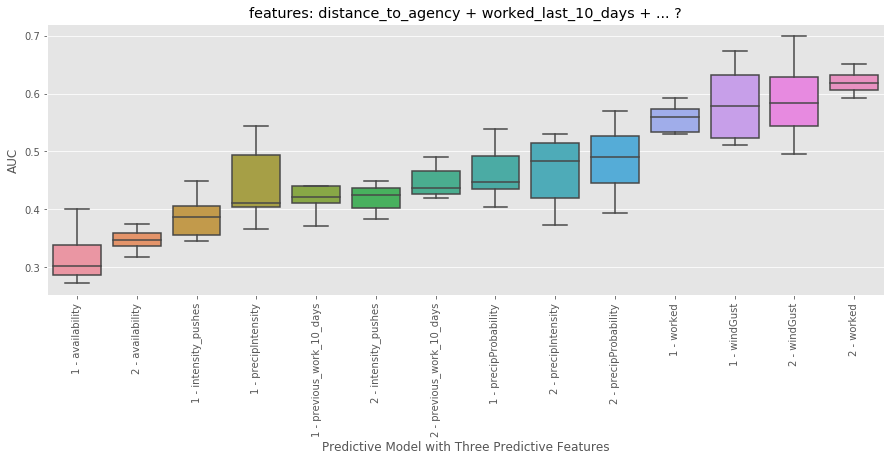

In [104]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf2)
plt.xlabel("Predictive Model with Three Predictive Features")
plt.ylabel("AUC")
plt.title('features: distance_to_agency + worked_last_10_days + ... ?');

In [105]:
# this data-frame will contain the AUC estimates
pre = ['distance_to_agency', 'worked', 'worked_last_10_days']
model_perf3 = pd.DataFrame({})
for (a, g) in dfa.groupby('agency_id'):
    for i, key in enumerate(g[columns].keys()):
        if key in (['label'] + pre): continue
        X_full, y_full = g[[key]+pre], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf3["{} - {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.377404
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.373052
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.379374
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.381384
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.379082
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.379130
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.380528
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.379439
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.379014
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.376466
  

Optimization terminated successfully.
         Current function value: 0.282324
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.284597
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.281275
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.284278
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.283177
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.282289
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.283480
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.284595
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.284729
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.253913
  

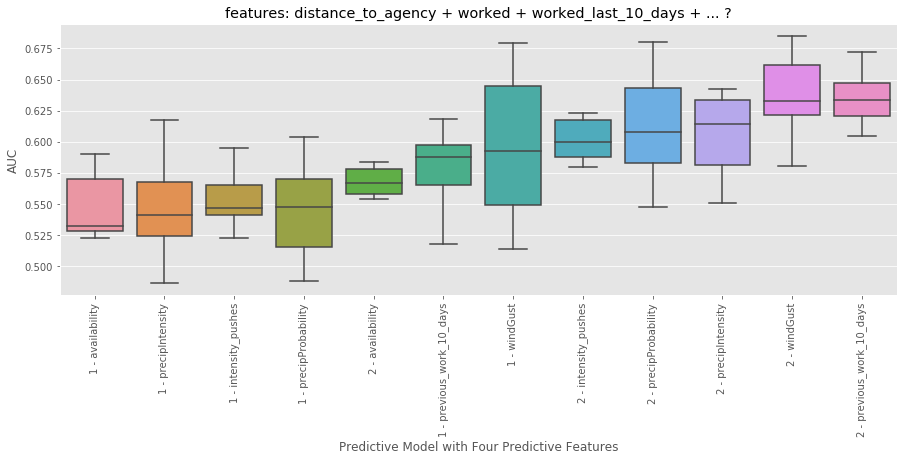

In [106]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf3)
plt.xlabel("Predictive Model with Four Predictive Features")
plt.ylabel("AUC")
plt.title('features: distance_to_agency + worked + worked_last_10_days + ... ?');

In [107]:
# this data-frame will contain the AUC estimates
pre = ['distance_to_agency', 'worked', 'worked_last_10_days', 'windGust']
model_perf4 = pd.DataFrame({})
for (a, g) in dfa.groupby('agency_id'):
    for i, key in enumerate(g[columns].keys()):
        if key in (['label'] + pre): continue
        X_full, y_full = g[[key]+pre], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf4["{} - {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.319531
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.322326
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.317934
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321637
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.322266
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.319126
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.323634
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321157
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.323196
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.322555
  

Optimization terminated successfully.
         Current function value: 0.202660
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.201445
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.201873
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.200087
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.202446
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.202287
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.202052
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.203647
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.201747
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.201386
  

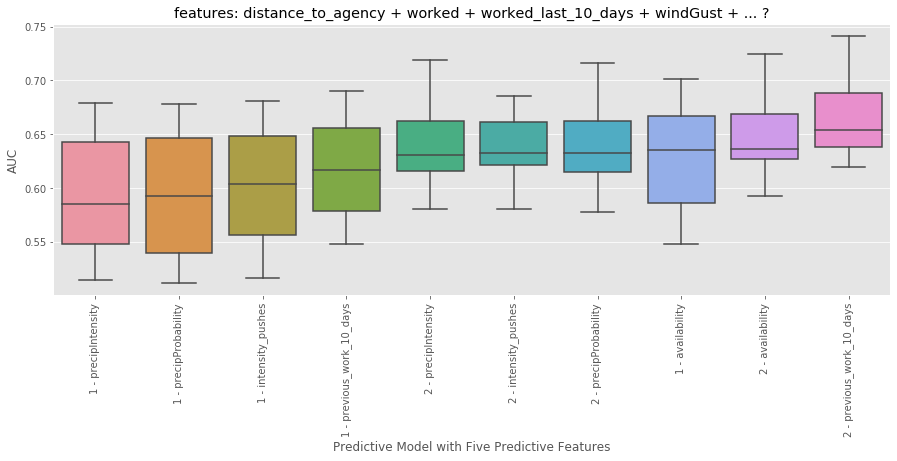

In [108]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf4)
plt.xlabel("Predictive Model with Five Predictive Features")
plt.ylabel("AUC")
plt.title('features: distance_to_agency + worked + worked_last_10_days + windGust + ... ?');

In [109]:
# this data-frame will contain the AUC estimates
pre = ['distance_to_agency', 'worked', 'worked_last_10_days', 'windGust', 'previous_work_10_days']
model_perf5 = pd.DataFrame({})
for (a, g) in dfa.groupby('agency_id'):
    for i, key in enumerate(g[columns].keys()):
        if key in (['label'] + pre): continue
        X_full, y_full = g[[key]+pre], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf5["{} - {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.317908
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320835
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.316261
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320069
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320516
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.317432
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321841
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.319312
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321450
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320502
  

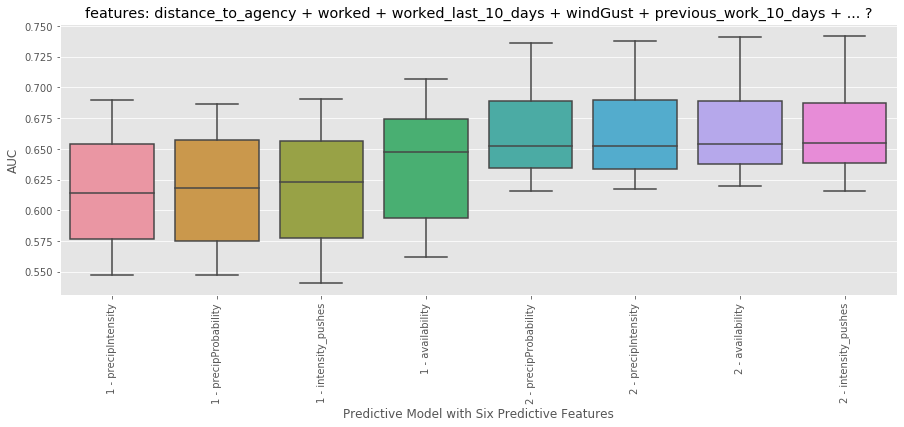

In [110]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf5)
plt.xlabel("Predictive Model with Six Predictive Features")
plt.ylabel("AUC")
plt.title('features: distance_to_agency + worked + worked_last_10_days + windGust + previous_work_10_days + ... ?');

In [111]:
# this data-frame will contain the AUC estimates
pre = ['distance_to_agency', 'worked', 'worked_last_10_days', 'windGust', 'previous_work_10_days', 'precipProbability']
model_perf6 = pd.DataFrame({})
for (a, g) in dfa.groupby('agency_id'):
    for i, key in enumerate(g[columns].keys()):
        if key in (['label'] + pre): continue
        X_full, y_full = g[[key]+pre], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf6["{} - {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.317627
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320832
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.316096
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.319773
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320471
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.317160
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321614
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.319297
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.321271
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.320455
  

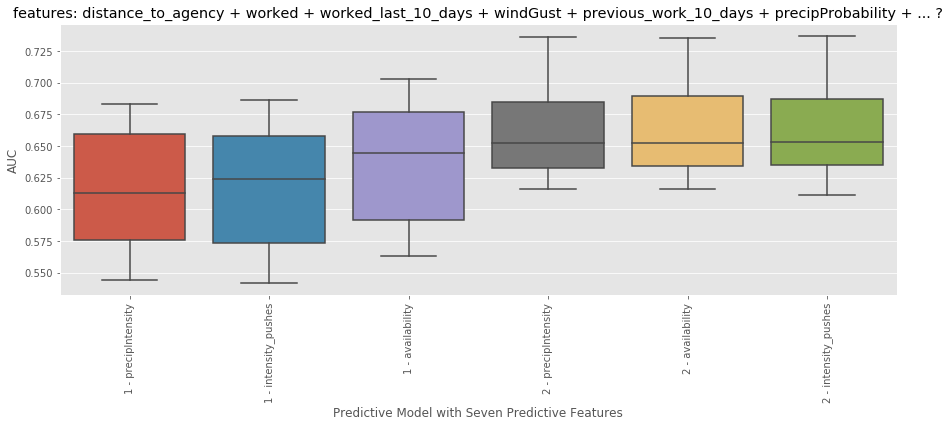

In [112]:
plt.figure(figsize= (15,5))
plot_boxplot_ordered(model_perf6)
plt.xlabel("Predictive Model with Seven Predictive Features")
plt.ylabel("AUC")
plt.title('features: distance_to_agency + worked + worked_last_10_days + windGust + previous_work_10_days + precipProbability + ... ?');

In [113]:
cols = pre.copy()
cols.remove('worked')
cols.remove('precipProbability')
cols.append('availability')
cols.append('label')
dft = dfa[dfa.agency_id == '1'][cols].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.303607
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               190889
Model:                          Logit   Df Residuals:                   190883
Method:                           MLE   Df Model:                            5
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.06676
Time:                        10:09:59   Log-Likelihood:                -57955.
converged:                       True   LL-Null:                       -62101.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
distance_to_agency       -0.1861      0.005    -37.995      0.000      -0.196      -0.177
worked_last_10_days       0.7080      0.024     29.529      0.000       0.661       0.755
windGust                 -0.0059      0.002     -3.232      0.001      -0.009      -0.002
previous_work_10_days     0.0423      0.002     26.733      0.000       0.039       0.045
availability              1.1000      0.022     49.116      0.000       1.056       1.144
Intercept                -3.4051      0.038    -90.222      0.000      -3.479      -3.331
=========================================================================================
"""

In [128]:
for coef in [-0.1861, 0.7080, -0.0059, 0.0423, 1.1000, -3.4051]:
    print(np.exp(coef)-1)

-0.16980942822633593
1.0299273414013412
-0.005882629179403853
0.04320739402933338
2.0041660239464334
-0.9667965004339889


In [115]:
np.exp(-3.4051) / (1 - np.exp(-3.4051))

0.03434383507915704

- if distance increase by 1 km, then odds decrease by 17%
- if driver work at least once in previous 10 days, then odds increase by 103%
- if windGust increase by one unit, the odds decrease by 0.6% (usual range: 10-30)
- for every itinerary done in previous 10 days the odds increase 4.3%
- if availability is true, then odds increases by more than 2 times
- The base level probability of accepting a job is 3.4%

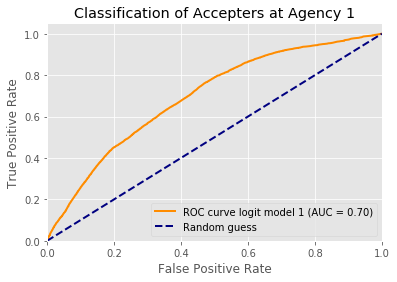

In [116]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [117]:
cols = pre.copy()
cols.remove('worked')
cols.remove('precipProbability')
cols.append('availability')
cols.append('label')
dft = dfa[dfa.agency_id == '2'][cols].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.186909
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               342061
Model:                          Logit   Df Residuals:                   342055
Method:                           MLE   Df Model:                            5
Date:                Sun, 17 May 2020   Pseudo R-squ.:                 0.07488
Time:                        10:10:01   Log-Likelihood:                -63934.
converged:                       True   LL-Null:                       -69109.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
distance_to_agency       -0.2145      0.006    -33.997      0.000      -0.227      -0.202
worked_last_10_days       0.8760      0.019     46.140      0.000       0.839       0.913
windGust                  0.0181      0.002     10.043      0.000       0.015       0.022
previous_work_10_days     0.0819      0.002     39.046      0.000       0.078       0.086
availability              0.7924      0.026     30.250      0.000       0.741       0.844
Intercept                -4.1420      0.035   -118.798      0.000      -4.210      -4.074
=========================================================================================
"""

In [118]:
for coef in [-0.2145, 0.8760, -0.0181, 0.0819, 0.7924, -4.1420]:
    print(np.exp(coef)-1)

-0.19305518826809942
1.4012753690986246
-0.017937178834293688
0.0853472696756643
1.208690928540331
-0.9841089623740142


In [119]:
np.exp(-4.1420) / (1 - np.exp(-4.1420))

0.016147640386945657

- if distance increase by 1 km, then odds decrease by 19%
- if driver work at least once in previous 10 days, then odds increase by 140%
- if windGust increase by one unit, the odds decrease by 1.8% (usual range: 10-30)
- for every itinerary done in previous 10 days the odds increase 8.5%
- if availability is true, then odds increases by more than 120%
- The base level probability of accepting a job is 1.6%

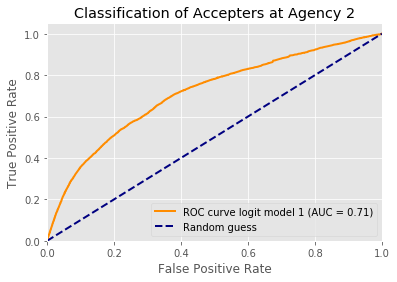

In [120]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])

plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 2')
plt.legend(loc='lower right')
plt.show()

### Per itinerary analysis

In [126]:
df.reset_index(drop=True, inplace=True)

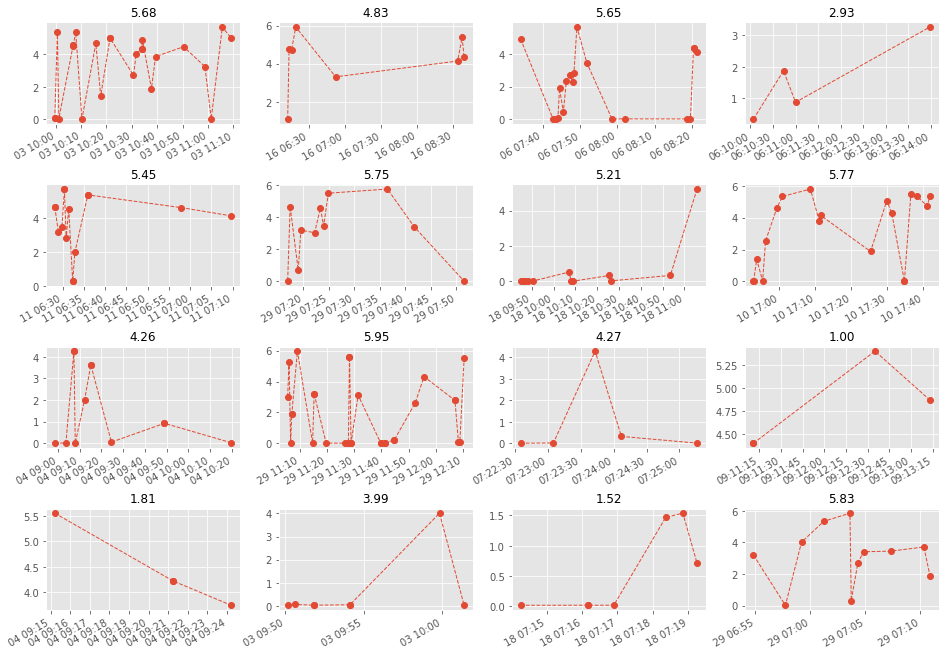

In [127]:
fig, axes = plt.subplots(4,4,figsize=(16,12))
axes = axes.flatten()
count = 0
for a, g in df.groupby(['agency_id','itinerary_id']):
    if count >= 16: break
    #print(a, g[['offer_time', 'distance_to_agency', 'label']].sort_values(by='offer_time'))
    if len(g.dropna()) > 3:
        d = g.dropna().sort_values(by='offer_time').set_index('offer_time')
        if d['distance_to_agency'].max() > 0.5: 
            d['distance_to_agency'].plot(ax=axes[count], marker='o', lw=1, ls='--')
            axes[count].set_title('{:.02f}'.format(d['distance_to_agency'].max() - d['distance_to_agency'].min()), fontsize=12)
            axes[count].set_xlabel('')
            count += 1

plt.subplots_adjust(hspace=0.6)